In [ ]:
# read nc output from WAOM 10km run

import xarray as xr
import pandas as p
import numpy as np
import numpy.ma as ma
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.dates as dates
from matplotlib.ticker import NullFormatter
from matplotlib.colors import LinearSegmentedColormap   # for custom colormaps

from datetime import datetime, timedelta

from netCDF4 import Dataset
from netCDF4 import num2date, date2num
from matplotlib.ticker import NullFormatter
from matplotlib.colors import LinearSegmentedColormap   # for custom colormaps

import iris
import iris.iterate
import iris.coords
import iris.plot as iplt
import gsw

In [ ]:
# load ROMS avg output
ds = xr.open_dataset("ocean_avg_0015.nc")
#print(output.variables.keys()) # get all variable names

temp = ds.variables["temp"]
salt = ds.variables["salt"]
print(temp.shape)
m_len = temp[:,0,0,0].size
k_len = temp[0,:,0,0].size
i_len = temp[0,0,:,0].size
j_len = temp[0,0,0,:].size

ds = ds.set_coords(['Cs_r', 'Cs_w', 'hc', 'h', 'Vtransform'])

if ds.Vtransform == 1:
    Zo_rho = ds.hc * (ds.s_rho - ds.Cs_r) + ds.Cs_r * ds.h
    z_rho = Zo_rho + ds.zeta * (1 + Zo_rho/ds.h)
    print("Vtransform=1")
elif ds.Vtransform == 2:
    Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * ds.h) / (ds.hc + ds.h)
    z_rho = ds.zeta + (ds.zeta + ds.h) * Zo_rho
    print("Vtransform=2")
ds.coords['z_rho'] = z_rho.transpose() # put z_rho into ds dataset

# read grid file for lon/lat coordinates
dg = xr.open_dataset("../waom10_frc/waom10_grd.nc")

lat_rho = dg.variables["lat_rho"]
lon_rho = dg.variables["lon_rho"]
ds.coords['lat_rho']=lat_rho#.transpose() # put lat_rho into ds dataset
ds.coords['lon_rho']=lon_rho#.transpose() # put lon_rho into ds dataset

# read waom10_swflx file for (E-P fluxes)
dfw = xr.open_dataset("../waom10_frc/waom10_swflux.nc")

dshf = xr.open_dataset("../waom10_frc/waom10_shflux.nc")


dfw

In [3]:
print(ds)

print(ds.lat_rho.shape)

print([lon_rho[338,420], lon_rho[338,600]],[lat_rho[338,420], lat_rho[338,600]])

<xarray.Dataset>
Dimensions:        (boundary: 4, eta_psi: 529, eta_rho: 530, eta_u: 530, eta_v: 529, ocean_time: 12, s_rho: 31, s_w: 32, tracer: 2, xi_psi: 629, xi_rho: 630, xi_u: 629, xi_v: 630)
Coordinates:
    Vtransform     int32 2
    hc             float64 250.0
  * s_rho          (s_rho) float64 -0.9839 -0.9516 -0.9194 ... -0.04839 -0.01613
  * s_w            (s_w) float64 -1.0 -0.9677 -0.9355 ... -0.06452 -0.03226 0.0
    Cs_r           (s_rho) float64 -0.9995 -0.997 ... -0.0008464 -9.329e-05
    Cs_w           (s_w) float64 ...
    h              (eta_rho, xi_rho) float64 3.532e+03 3.615e+03 ... 4.966e+03
    x_rho          (eta_rho, xi_rho) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    y_rho          (eta_rho, xi_rho) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    x_u            (eta_u, xi_u) float64 ...
    y_u            (eta_u, xi_u) float64 ...
    x_v            (eta_v, xi_v) float64 ...
    y_v            (eta_v, xi_v) float64 ...
    x_psi          (eta_psi, xi_psi

(12, 180, 360)
(180, 360)


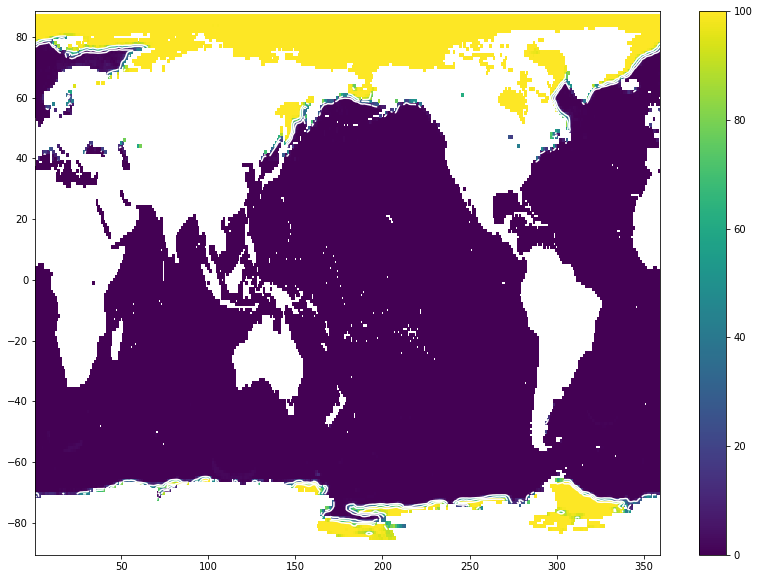

In [6]:
Test = np.fromfile("../SSMI/ICE.07",count=(180*12*360),dtype='float32').reshape((12,180,360))
               
print(Test.shape)
Test_m = ma.masked_less(Test, -900)

ice_lat, ice_lon = np.meshgrid(np.arange(-90.5,89.5,1), np.arange(0.5,360.5,1), sparse=False, indexing='ij')

print(ice_lat.shape)

fig = plt.figure(figsize=(14,10))

ci = plt.pcolor(ice_lon, ice_lat,np.squeeze(Test_m[1,:,:]))
cbar =fig.colorbar(ci)
cf = plt.contour(ice_lon, ice_lat,np.squeeze(Test_m[1,:,:]),levels=[15, 50, 85],colors='white')


/opt/miniconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


temp,Hsbl size= (530, 630) (530, 630)
zice size (530, 630)


/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:69: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


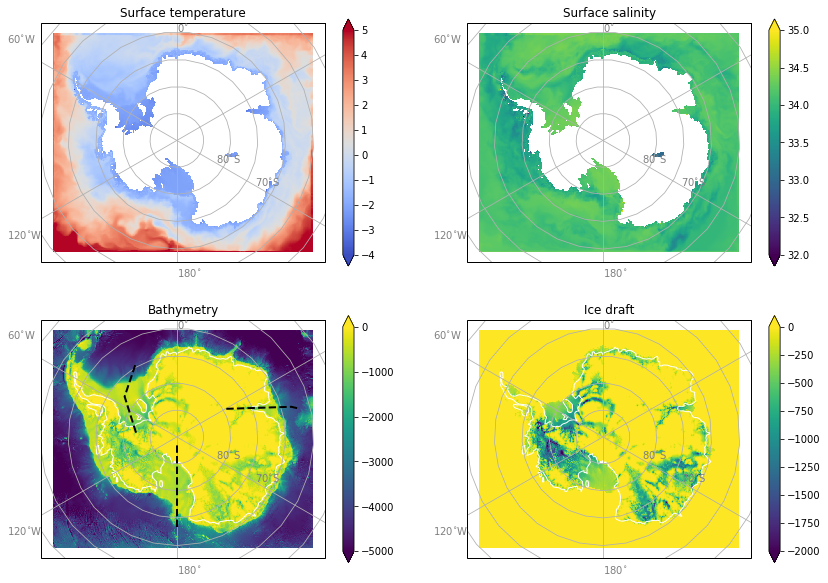

In [7]:
### plot some maps

def lonlat_labels(ax):
    # latitude labels
    ax.text(120,-80,'80$^{\circ}$S',transform=ccrs.PlateCarree(),color='gray')
    ax.text(120,-70,'70$^{\circ}$S',transform=ccrs.PlateCarree(),color='gray')
    # longitude labels
    ax.text(0,-66,'0$^{\circ}$',transform=ccrs.PlateCarree(),color='gray')
    #ax.text(60,-53,'60$^{\circ}$E',transform=ccrs.PlateCarree(),color='gray')
    #ax.text(120,-53,'120$^{\circ}$E',transform=ccrs.PlateCarree(),color='gray')
    ax.text(-60,-48,'60$^{\circ}$W',transform=ccrs.PlateCarree(),color='gray')
    ax.text(-120,-48,'120$^{\circ}$W',transform=ccrs.PlateCarree(),color='gray')
    ax.text(180,-60,'180$^{\circ}$',transform=ccrs.PlateCarree(),color='gray')
    return
    

temp_sfc = ds.temp.isel(s_rho=-1).mean(axis=0)
salt_sfc = ds.salt.isel(s_rho=-1).mean(axis=0)#, ocean_time=1)
Hsbl = ds.Hsbl.isel(ocean_time=9) #mean(axis=0)
print('temp,Hsbl size=', temp_sfc.shape, Hsbl.shape)

levelsT = np.arange(-4,5,.1)
levelsS = np.arange(32,35.,.1)

# call cartopy projection
proj = ccrs.SouthPolarStereo()
fig = plt.figure(figsize=(14,10))

ax1 = fig.add_subplot(221, projection=proj)
ct=plt.pcolormesh(lon_rho,lat_rho,temp_sfc, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=-4, vmax=5)
cbart =fig.colorbar(ct, extend='both')
plt.title('Surface temperature')
ax1.gridlines() # draw_labels=True,linewidth=2, color='gray', alpha=0.5, linestyle='--')
lonlat_labels(ax1)

ax2 = fig.add_subplot(222, projection=proj)
cs=plt.pcolormesh(lon_rho,lat_rho,salt_sfc, transform=ccrs.PlateCarree(), cmap=plt.cm.viridis, vmin=32, vmax=35)
cbars =fig.colorbar(cs, extend='both')
plt.title('Surface salinity')
#ax1.coastlines(resolution='110m')
ax2.gridlines()
lonlat_labels(ax2)

ax3 = fig.add_subplot(223, projection=proj)
ch=plt.pcolormesh(lon_rho,lat_rho, -ds.h, transform=ccrs.PlateCarree(),cmap=plt.cm.viridis, vmin=-5000, vmax=0)
cbarh =fig.colorbar(ch, extend='both')
plt.title('Bathymetry')
plt.plot([lon_rho[338,420], lon_rho[338,600]],[lat_rho[338,420], lat_rho[338,600]], transform=ccrs.PlateCarree(),color='black', linewidth=2, linestyle='dashed')   # prydz: slice(420,600), eta_rho=338
plt.plot([lon_rho[50,300], lon_rho[250,300]],[lat_rho[50,300], lat_rho[250,300]],color='black', transform=ccrs.PlateCarree(),linewidth=2, linestyle='dashed')   # ross: xi_rho=300, eta_rho=slice(50,250)
plt.plot([lon_rho[280,200], lon_rho[450,200]],[lat_rho[280,200], lat_rho[450,200]],color='black',transform=ccrs.PlateCarree(),linewidth=2, linestyle='dashed')# weddell: xi_rho=200, eta_rho=slice(280,450)
ax3.gridlines()
ax3.coastlines(resolution='110m',color='white')
lonlat_labels(ax3)

print('zice size', ds.zice.shape)
ax4 = fig.add_subplot(224, projection=proj)
#ds.zice.plot(ax=ax4, levels=np.arange(-500,0,50))
cice = plt.pcolormesh(lon_rho,lat_rho, ds.zice, transform=ccrs.PlateCarree(), vmin=-2000, vmax=0)#, levels=np.arange(-500,0,50))
cbari =fig.colorbar(cice, extend='both')
plt.title('Ice draft')
#cfw=plt.pcolormesh(lon_rho,lat_rho, np.squeeze(dfw.swflux.mean(axis=0)), transform=ccrs.PlateCarree(),cmap=plt.cm.coolwarm, vmin=-1, vmax=1)
#cbarfw =fig.colorbar(cfw, extend='both')
#plt.title('E-P fluxes')
ax4.gridlines()
ax4.coastlines(resolution='110m',color='white')
lonlat_labels(ax4)


plt.tight_layout()

plt.savefig('../figs/waom10_surface_TS_h+ice__annual.png')

## TO-DOs:
# plot maps of sea-ice concentration - monthly?
# comparison with satellite-based products
# labels -> easier on cartopy/basemap?
# MLD using Downes criteria!


In [5]:
print(np.min(lon_rho))
print(np.max(lon_rho))
print(np.min(lat_rho))
print(np.max(lat_rho))



<xarray.Variable ()>
array(-179.89369995)
<xarray.Variable ()>
array(179.89369995)
<xarray.Variable ()>
array(-89.93492031)
<xarray.Variable ()>
array(-52.20024408)


/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


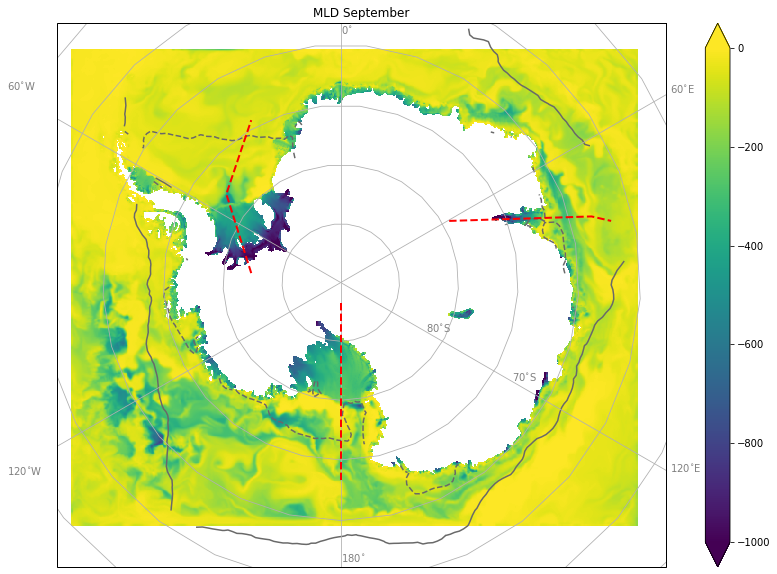

In [8]:
fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111, projection=proj)
ch=plt.pcolormesh(lon_rho,lat_rho, Hsbl, transform=ccrs.PlateCarree(),cmap=plt.cm.viridis, vmin=-1000, vmax=0)
cbarh =fig.colorbar(ch, extend='both')
plt.title('MLD September')
plt.plot([lon_rho[338,420], lon_rho[338,600]],[lat_rho[338,420], lat_rho[338,600]], transform=ccrs.PlateCarree(),color='red', linewidth=2, linestyle='dashed')   # prydz: slice(420,600), eta_rho=338
plt.plot([lon_rho[50,300], lon_rho[250,300]],[lat_rho[50,300], lat_rho[250,300]],color='red', transform=ccrs.PlateCarree(),linewidth=2, linestyle='dashed')   # ross: xi_rho=300, eta_rho=slice(50,250)
plt.plot([lon_rho[280,200], lon_rho[450,200]],[lat_rho[280,200], lat_rho[450,200]],color='red',transform=ccrs.PlateCarree(),linewidth=2, linestyle='dashed')# weddell: xi_rho=200, eta_rho=slice(280,450)
# latitude labels
plt.text(120,-80,'80$^{\circ}$S',transform=ccrs.PlateCarree(),color='gray')
plt.text(120,-70,'70$^{\circ}$S',transform=ccrs.PlateCarree(),color='gray')
# longitude labels
plt.text(0,-65,'0$^{\circ}$',transform=ccrs.PlateCarree(),color='gray')
plt.text(60,-52.5,'60$^{\circ}$E',transform=ccrs.PlateCarree(),color='gray')
plt.text(120,-52.5,'120$^{\circ}$E',transform=ccrs.PlateCarree(),color='gray')
plt.text(-60,-52,'60$^{\circ}$W',transform=ccrs.PlateCarree(),color='gray')
plt.text(-120,-52,'120$^{\circ}$W',transform=ccrs.PlateCarree(),color='gray')
plt.text(180,-62,'180$^{\circ}$',transform=ccrs.PlateCarree(),color='gray')
ax.gridlines()
# testing x/y limits
#ax.set_extent([-180, 180, -80, -59], ccrs.PlateCarree())
# sea-ice contours
ci=plt.contour(ice_lon[:30,:], ice_lat[:30,:],np.squeeze(Test_m[8,:30,:]), levels=[75],colors='dimgray', transform=ccrs.PlateCarree()) #
ci=plt.contour(ice_lon[:30,:], ice_lat[:30,:],np.squeeze(Test_m[2,:30,:]), levels=[75],colors='dimgray', linestyles='dashed',transform=ccrs.PlateCarree()) #
plt.tight_layout()
plt.savefig('../figs/waom10_MLD+transects.png')



[1, 32, 61, 93, 124, 156, 187, 219, 251, 282, 314, 345] [31, 60, 92, 123, 155, 186, 218, 250, 281, 313, 344, 365]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]
temp,Hsbl size= (530, 630) (530, 630)


/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


[31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54
 55 56 57 58]
temp,Hsbl size= (530, 630) (530, 630)
[60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83
 84 85 86 87 88 89 90]
temp,Hsbl size= (530, 630) (530, 630)
[ 92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109
 110 111 112 113 114 115 116 117 118 119 120 121]
temp,Hsbl size= (530, 630) (530, 630)
[123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140
 141 142 143 144 145 146 147 148 149 150 151 152 153]
temp,Hsbl size= (530, 630) (530, 630)
[155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172
 173 174 175 176 177 178 179 180 181 182 183 184]
temp,Hsbl size= (530, 630) (530, 630)
[186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203
 204 205 206 207 208 209 210 211 212 213 214 215 216]
temp,Hsbl size= (530, 630) (530, 630)
[218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235
 236 237 238 239

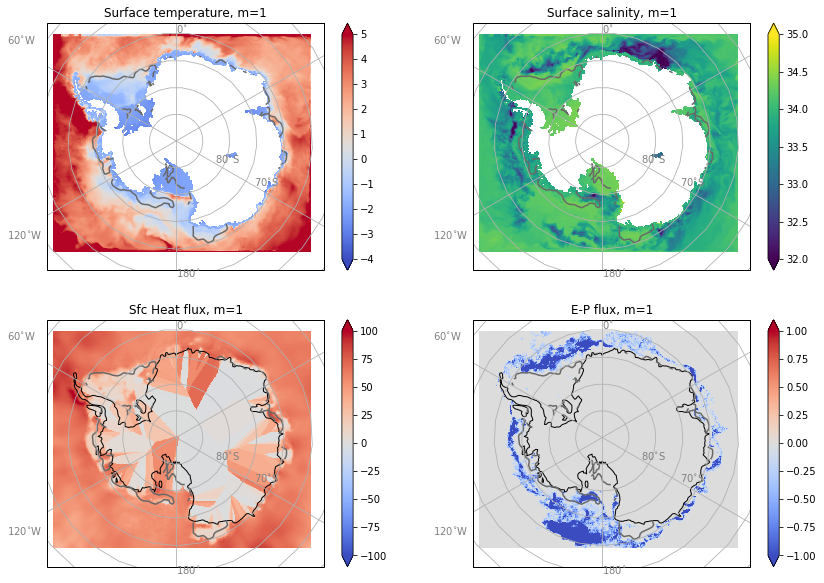

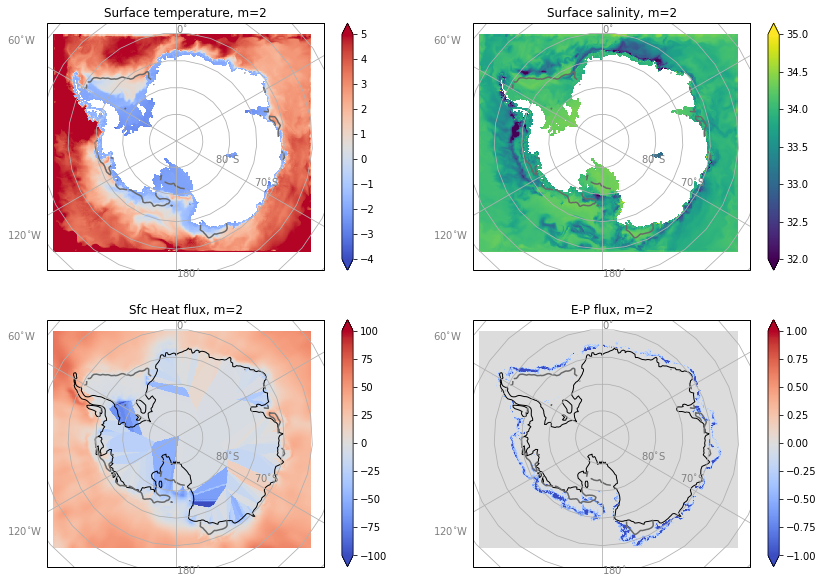

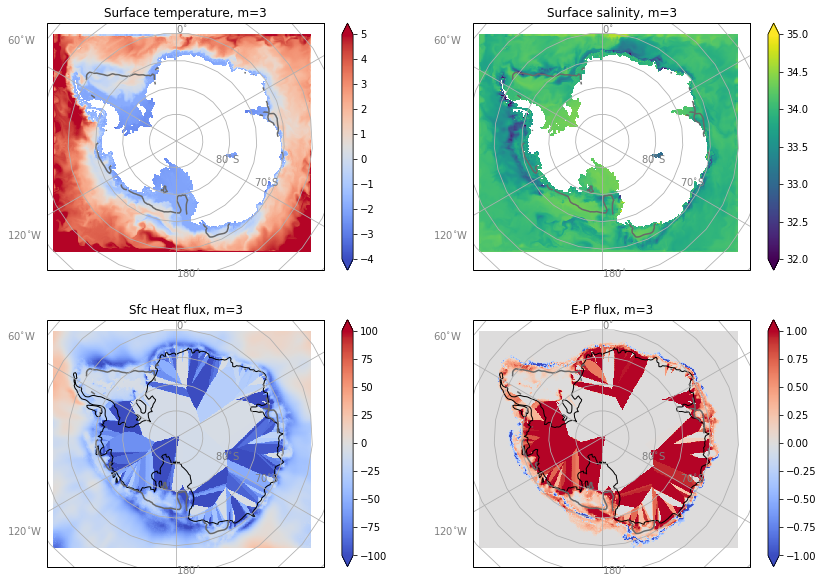

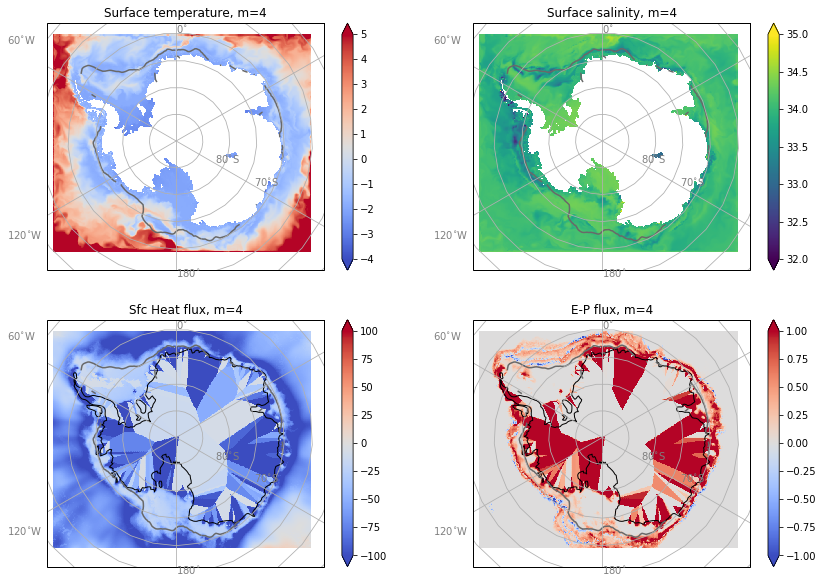

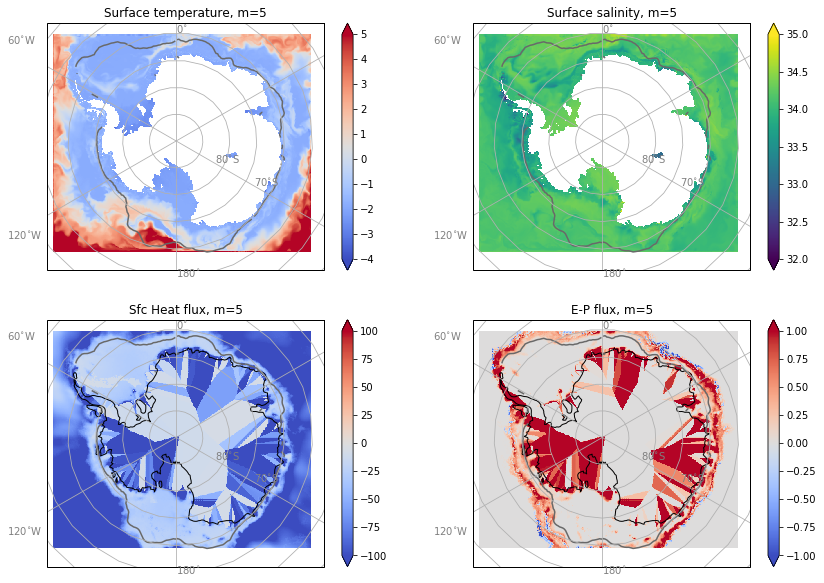

...

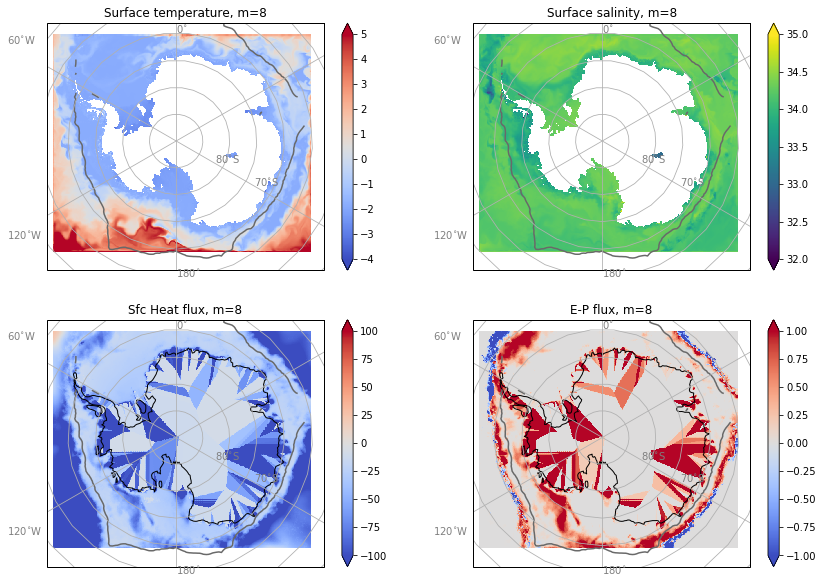

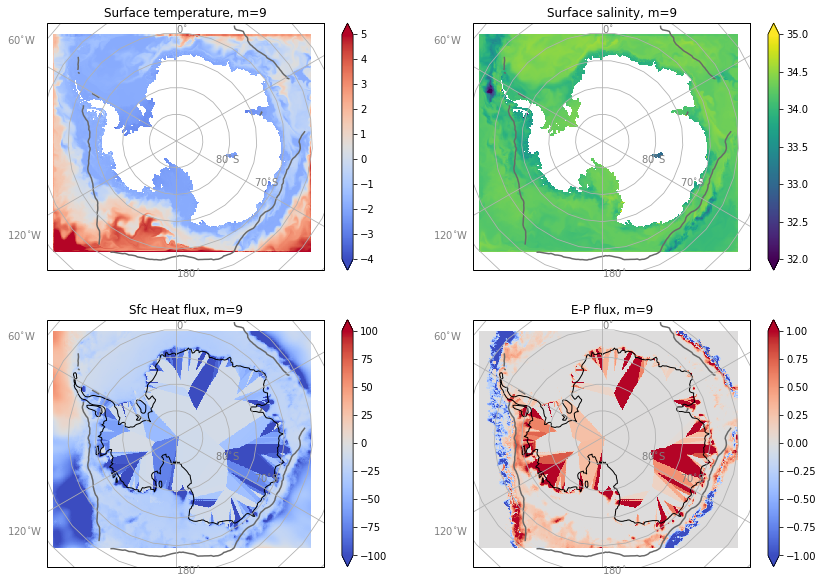

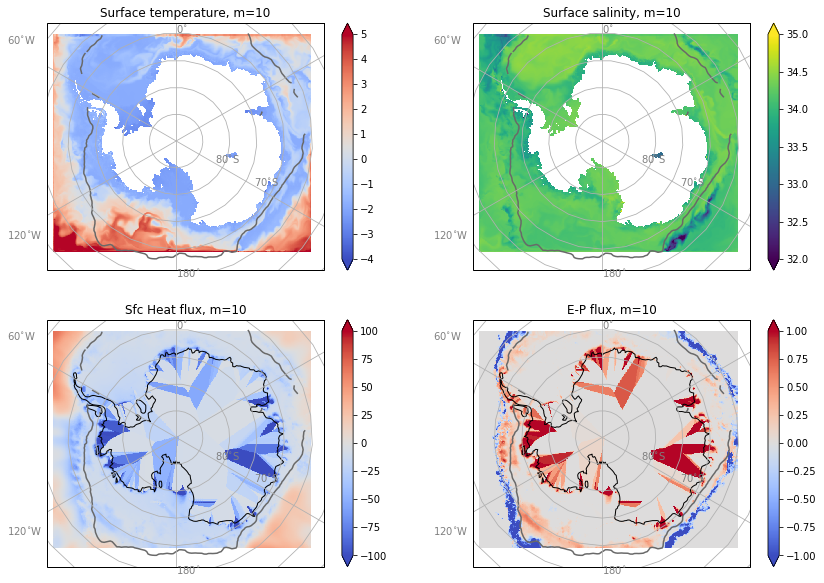

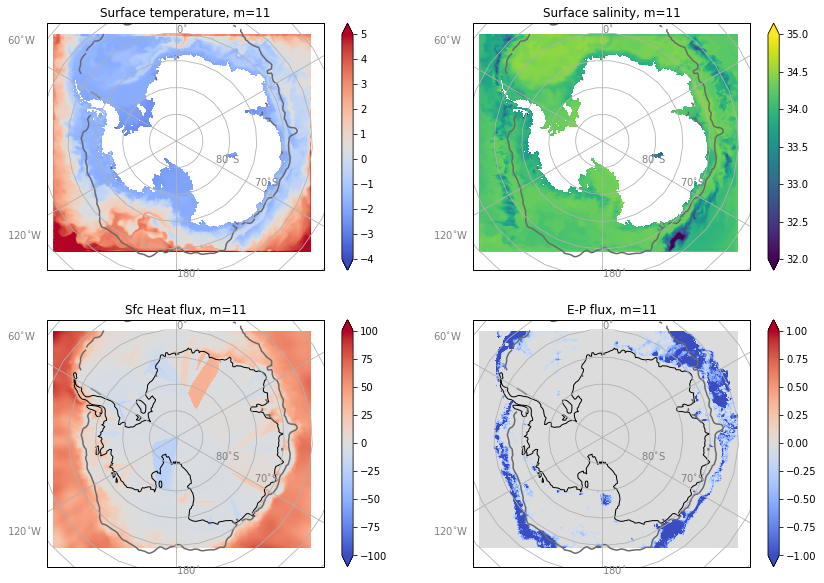

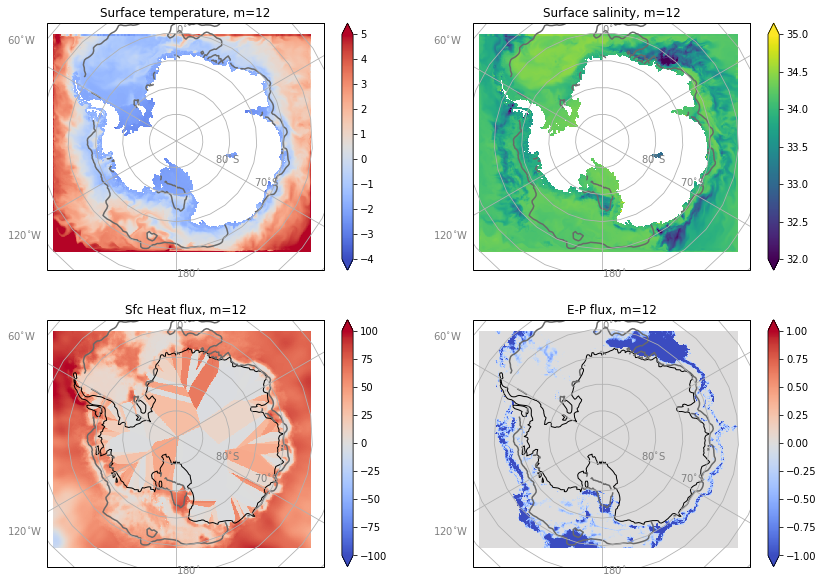

In [9]:
# plot some maps
fig_path='/Users/boeiradi/COLD_project/ROMS_runs/figs/'

months_start=[1,32,61,93,124,156,187,219,251,282,314,345]
months_end=[31,60,92,123,155,186,218,250,281,313,344,365]
print(months_start,months_end)

for mm in np.arange(0,12):
    swf_range=np.arange(months_start[mm]-1,months_end[mm]-1,1)
    print(swf_range)

    temp_sfc_mm = ds.temp.isel(s_rho=-1, ocean_time=mm)
    salt_sfc_mm = ds.salt.isel(s_rho=-1, ocean_time=mm)
    Hsbl_mm = ds.Hsbl.isel(ocean_time=mm)
    print('temp,Hsbl size=', temp_sfc.shape, Hsbl.shape)

    levelsT = np.arange(-4,5,.1)
    levelsS = np.arange(32,35.,.1)

    # call cartopy projection
    proj = ccrs.SouthPolarStereo()
    fig = plt.figure(figsize=(14,10))

    ax1 = fig.add_subplot(221, projection=proj)
    ci=plt.contour(ice_lon[:30,:], ice_lat[:30,:],np.squeeze(Test_m[mm,:30,:]), levels=[75],colors='dimgray', transform=ccrs.PlateCarree()) #
    ct=plt.pcolormesh(lon_rho,lat_rho,temp_sfc_mm, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=-4, vmax=5)
    cbart =fig.colorbar(ct, extend='both')
    plt.title('Surface temperature, m=' + str(mm+1))
    lonlat_labels(ax1)


    ax2 = fig.add_subplot(222, projection=proj)
    ci=plt.contour(ice_lon[:30,:], ice_lat[:30,:],np.squeeze(Test_m[mm,:30,:]), levels=[75],colors='dimgray', transform=ccrs.PlateCarree()) #
    cs=plt.pcolormesh(lon_rho,lat_rho,salt_sfc_mm, transform=ccrs.PlateCarree(), cmap=plt.cm.viridis, vmin=32, vmax=35)
    cbars =fig.colorbar(cs, extend='both')
    plt.title('Surface salinity, m=' + str(mm+1))
    ax1.gridlines() # draw_labels=True,linewidth=2, color='gray', alpha=0.5, linestyle='--')
    ax2.gridlines()
    lonlat_labels(ax2)

    ax3 = fig.add_subplot(223, projection=proj)
    ci=plt.contour(ice_lon[:30,:], ice_lat[:30,:],np.squeeze(Test_m[mm,:30,:]), levels=[75],colors='dimgray', transform=ccrs.PlateCarree()) #
    cshf=plt.pcolormesh(lon_rho,lat_rho, np.squeeze(dshf.shflux.isel(shf_time=swf_range).mean(axis=0)), transform=ccrs.PlateCarree(),cmap=plt.cm.coolwarm, vmin=-100, vmax=100)
    cbarh =fig.colorbar(cshf, extend='both')
    plt.title('Sfc Heat flux, m=' + str(mm+1))
    ax3.gridlines()
    ax3.coastlines(resolution='110m',color='black')
    ax3.add_feature(cfeature.LAND, facecolor='0.75')
    lonlat_labels(ax3)
    
    ax4 = fig.add_subplot(224, projection=proj)
    ci=plt.contour(ice_lon[:30,:], ice_lat[:30,:],np.squeeze(Test_m[mm,:30,:]), levels=[75],colors='dimgray', transform=ccrs.PlateCarree()) #
    cfw=plt.pcolormesh(lon_rho,lat_rho, np.squeeze(dfw.swflux.isel(swf_time=swf_range).mean(axis=0)), transform=ccrs.PlateCarree(),cmap=plt.cm.coolwarm, vmin=-1, vmax=1)
    cbarfw =fig.colorbar(cfw, extend='both')
    plt.title('E-P flux, m=' + str(mm+1))
    ax4.gridlines()
    ax4.coastlines(resolution='110m',color='black')
    ax4.add_feature(cfeature.LAND, facecolor='0.75')
    lonlat_labels(ax4)

    plt.tight_layout()
    
    month=str(mm+1)

#    name_fig="waom10_surface_maps_annual_m=" + month + ".png"
    name_fig="waom10_sfc_TS_fluxes_maps_annual_m=" + month + ".png"
    plt.savefig(fig_path + name_fig)
    
## plot maps of sea-ice concentration - monthly?
# comparison with satellite-based products
# labels -> easier on cartopy/basemap?
# X inverse transform: 

[1, 32, 61, 93, 124, 156, 187, 219, 251, 282, 314, 345] [31, 60, 92, 123, 155, 186, 218, 250, 281, 313, 344, 365]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]
temp,Hsbl size= (530, 630) (530, 630)


/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


[31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54
 55 56 57 58]
temp,Hsbl size= (530, 630) (530, 630)
[60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83
 84 85 86 87 88 89 90]
temp,Hsbl size= (530, 630) (530, 630)
[ 92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109
 110 111 112 113 114 115 116 117 118 119 120 121]
temp,Hsbl size= (530, 630) (530, 630)
[123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140
 141 142 143 144 145 146 147 148 149 150 151 152 153]
temp,Hsbl size= (530, 630) (530, 630)
[155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172
 173 174 175 176 177 178 179 180 181 182 183 184]
temp,Hsbl size= (530, 630) (530, 630)
[186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203
 204 205 206 207 208 209 210 211 212 213 214 215 216]
temp,Hsbl size= (530, 630) (530, 630)
[218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235
 236 237 238 239

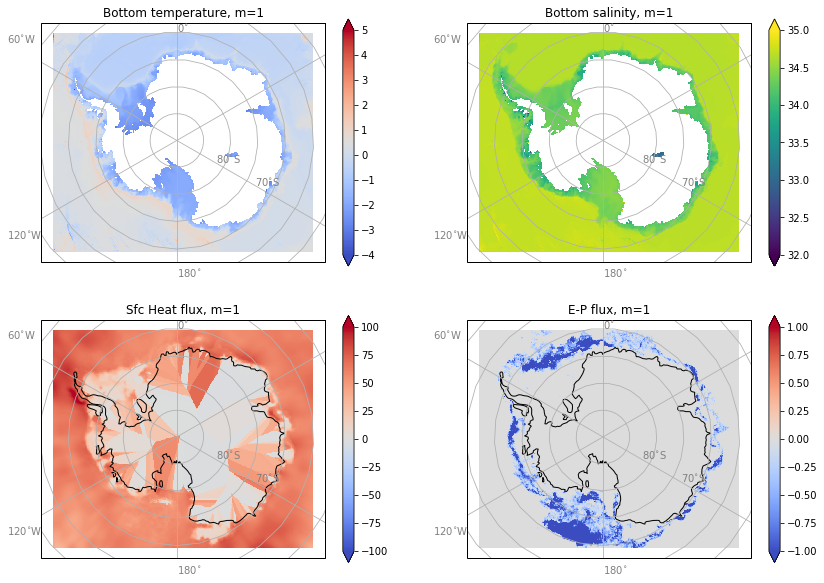

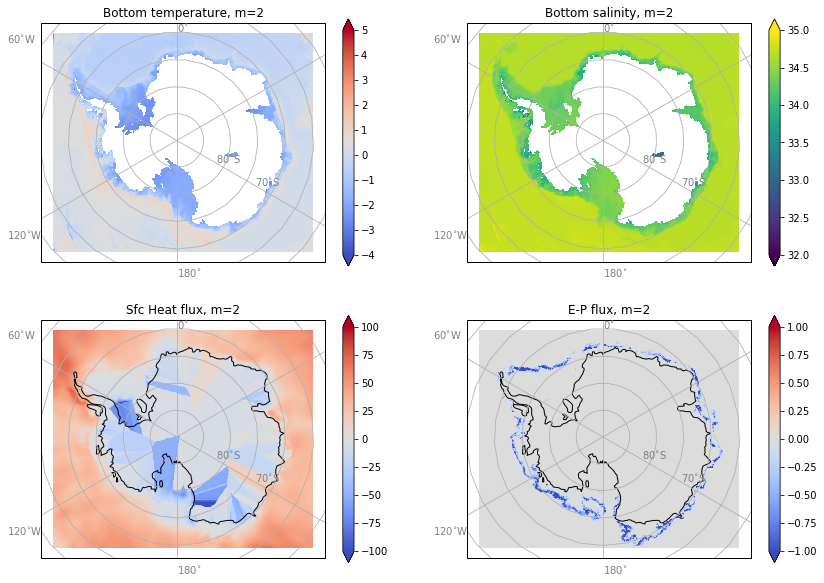

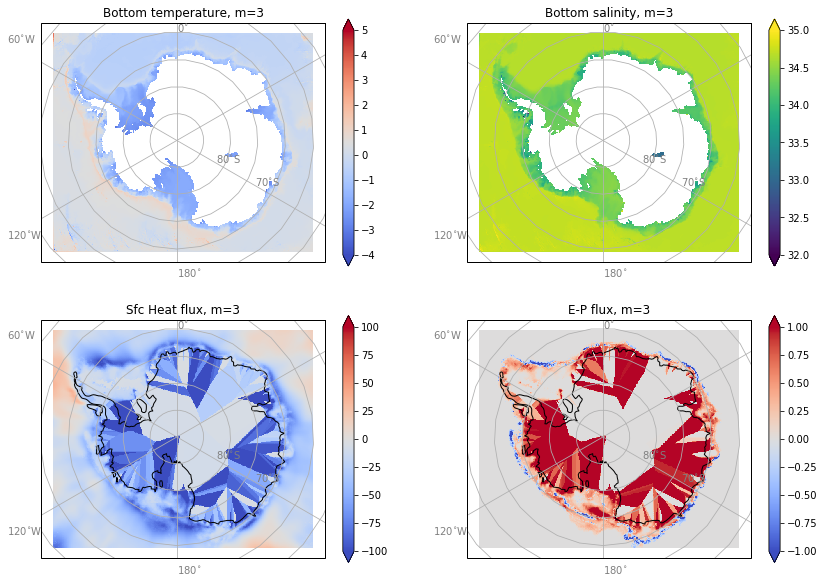

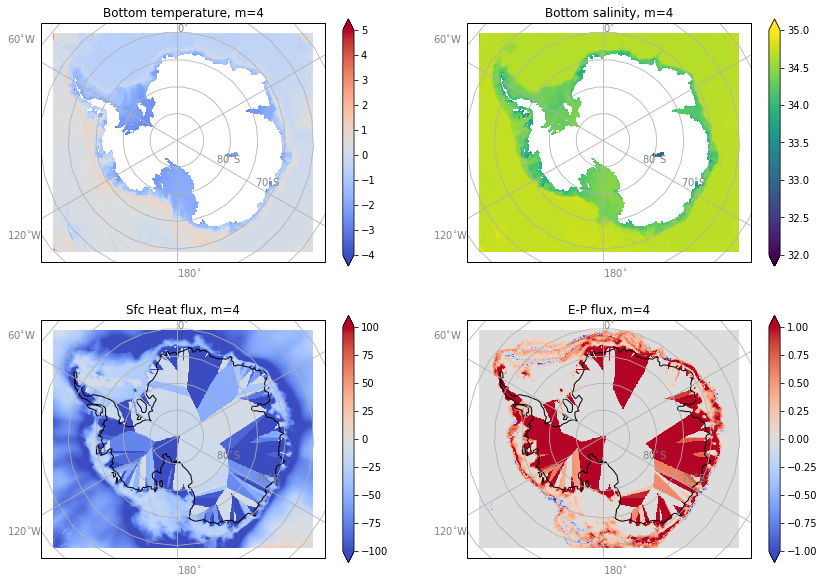

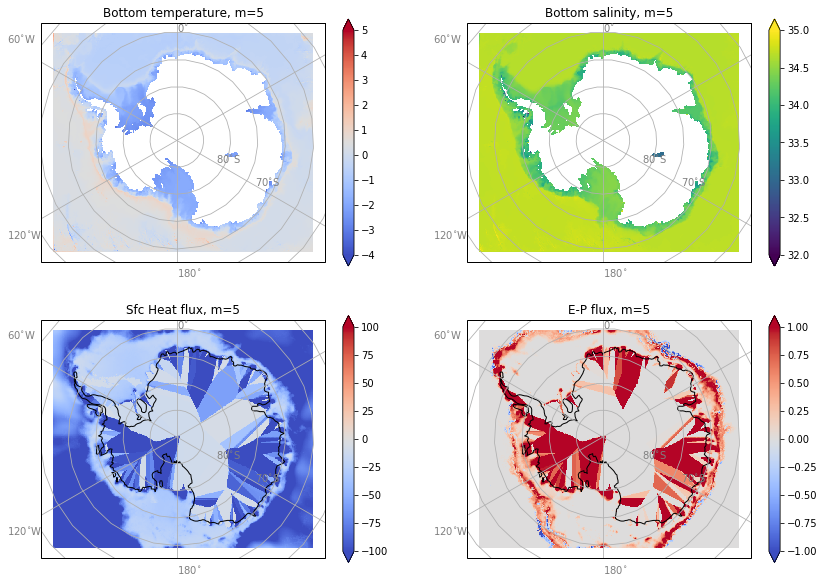

...

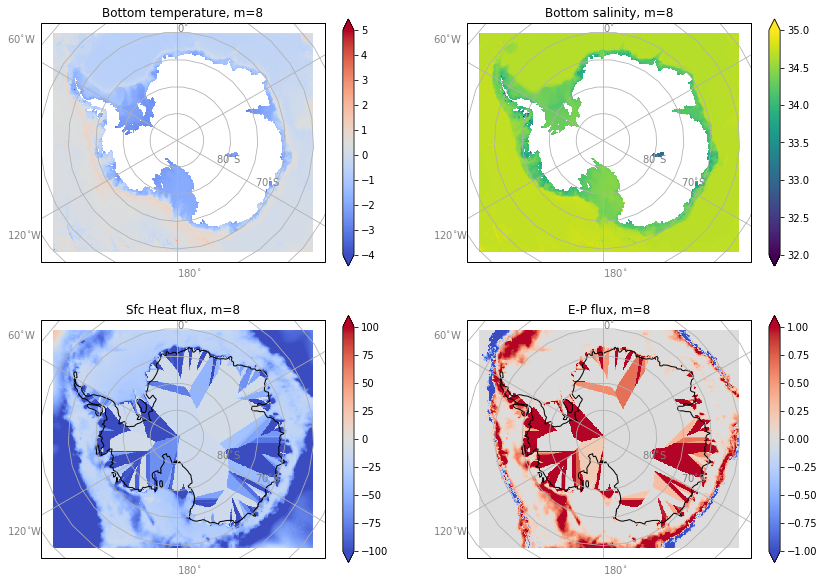

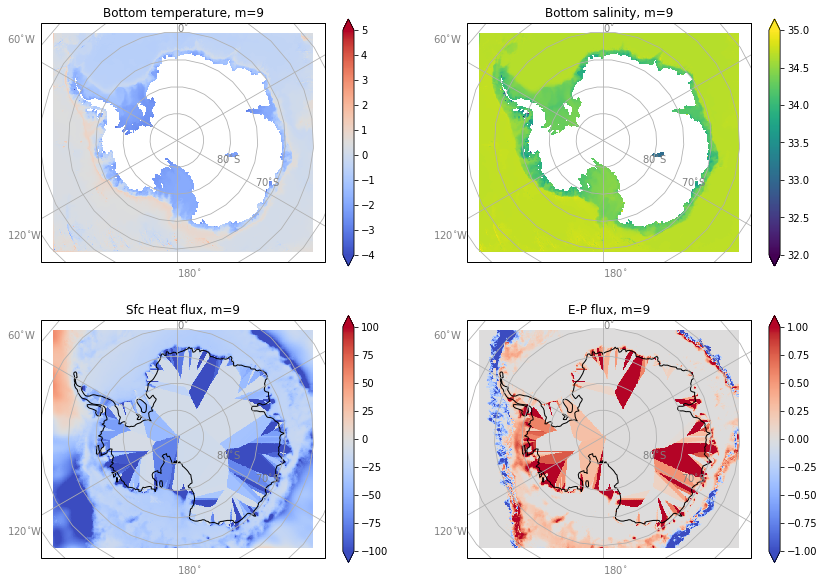

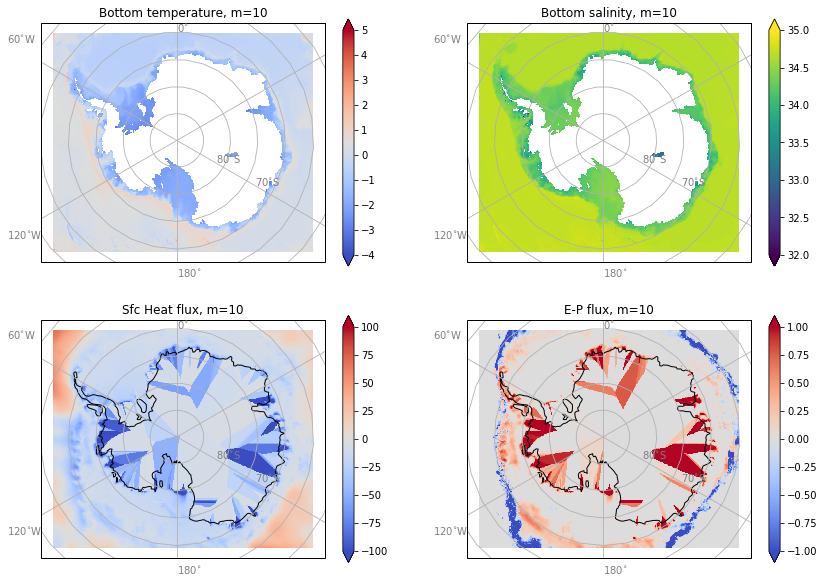

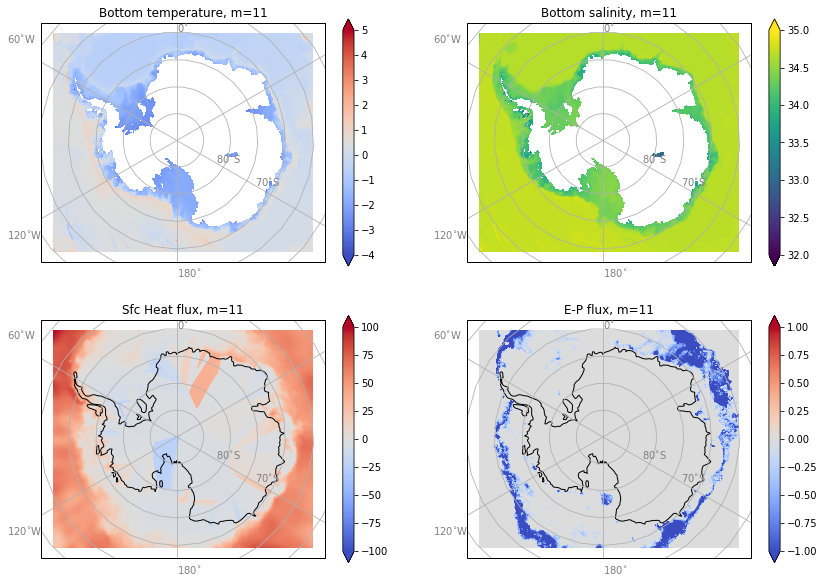

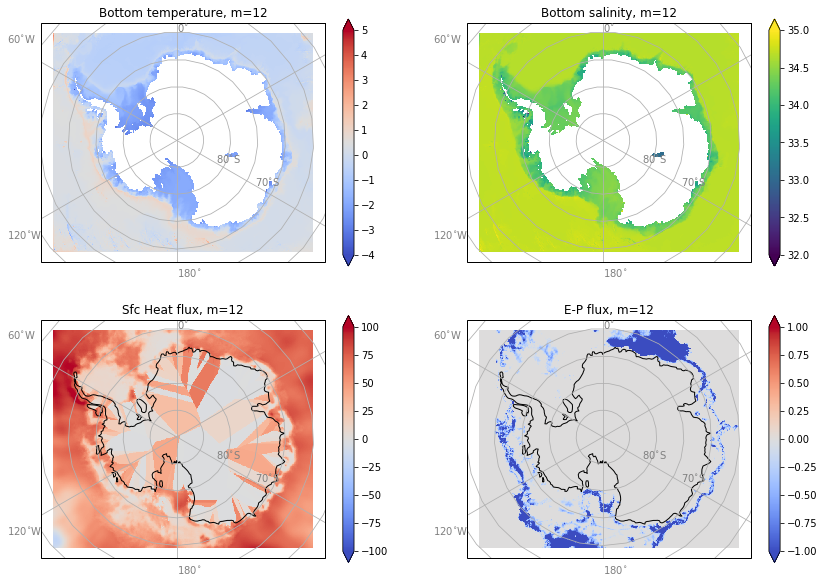

In [11]:
# plot some maps
fig_path='/Users/boeiradi/COLD_project/ROMS_runs/figs/'

months_start=[1,32,61,93,124,156,187,219,251,282,314,345]
months_end=[31,60,92,123,155,186,218,250,281,313,344,365]
print(months_start,months_end)

for mm in np.arange(0,12):
    swf_range=np.arange(months_start[mm]-1,months_end[mm]-1,1)
    print(swf_range)

    temp_bot_mm = ds.temp.isel(s_rho=0, ocean_time=mm)
    salt_bot_mm = ds.salt.isel(s_rho=0, ocean_time=mm)
    Hsbl_mm = ds.Hsbl.isel(ocean_time=mm)
    print('temp,Hsbl size=', temp_sfc.shape, Hsbl.shape)

    levelsT = np.arange(-4,5,.1)
    levelsS = np.arange(32,35.,.1)

    # call cartopy projection
    proj = ccrs.SouthPolarStereo()
    fig = plt.figure(figsize=(14,10))

    ax1 = fig.add_subplot(221, projection=proj)
    ct=plt.pcolormesh(lon_rho,lat_rho,temp_bot_mm, transform=ccrs.PlateCarree(), cmap=plt.cm.coolwarm, vmin=-4, vmax=5)
    cbart =fig.colorbar(ct, extend='both')
    plt.title('Bottom temperature, m=' + str(mm+1))
    lonlat_labels(ax1)


    ax2 = fig.add_subplot(222, projection=proj)
    cs=plt.pcolormesh(lon_rho,lat_rho,salt_bot_mm, transform=ccrs.PlateCarree(), cmap=plt.cm.viridis, vmin=32, vmax=35)
    cbars =fig.colorbar(cs, extend='both')
    plt.title('Bottom salinity, m=' + str(mm+1))
    ax1.gridlines() # draw_labels=True,linewidth=2, color='gray', alpha=0.5, linestyle='--')
    ax2.gridlines()
    lonlat_labels(ax2)

    ax3 = fig.add_subplot(223, projection=proj)
    cshf=plt.pcolormesh(lon_rho,lat_rho, np.squeeze(dshf.shflux.isel(shf_time=swf_range).mean(axis=0)), transform=ccrs.PlateCarree(),cmap=plt.cm.coolwarm, vmin=-100, vmax=100)
    cbarh =fig.colorbar(cshf, extend='both')
    plt.title('Sfc Heat flux, m=' + str(mm+1))
    ax3.gridlines()
    ax3.coastlines(resolution='110m',color='black')
    ax3.add_feature(cfeature.LAND, facecolor='0.75')
    lonlat_labels(ax3)
    
    ax4 = fig.add_subplot(224, projection=proj)
    cfw=plt.pcolormesh(lon_rho,lat_rho, np.squeeze(dfw.swflux.isel(swf_time=swf_range).mean(axis=0)), transform=ccrs.PlateCarree(),cmap=plt.cm.coolwarm, vmin=-1, vmax=1)
    cbarfw =fig.colorbar(cfw, extend='both')
    plt.title('E-P flux, m=' + str(mm+1))
    ax4.gridlines()
    ax4.coastlines(resolution='110m',color='black')
    ax4.add_feature(cfeature.LAND, facecolor='0.75')
    lonlat_labels(ax4)

    plt.tight_layout()
    
    month=str(mm+1)

#    name_fig="waom10_Bottom_maps_annual_m=" + month + ".png"
    name_fig="waom10_bot_TS_fluxes_maps_annual_m=" + month + ".png"
    plt.savefig(fig_path + name_fig)
    
## plot maps of sea-ice concentration - monthly?
# comparison with satellite-based products
# labels -> easier on cartopy/basemap?
# X inverse transform: 

/opt/miniconda3/lib/python3.7/site-packages/matplotlib/colors.py:972: RuntimeWarning: invalid value encountered in subtract
  resdat -= vmin


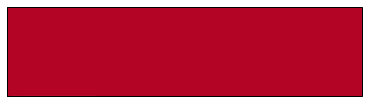